In [1]:
import torch
from torchvision.io import read_image
from torchvision.transforms import *
from PIL import Image
import numpy as np
from diffusers import (
    AutoencoderKL,
    StableDiffusionXLPipeline, 
    StableDiffusionXLImg2ImgPipeline,
    UNet2DConditionModel, 
    EulerDiscreteScheduler
)
from huggingface_hub import hf_hub_download
from safetensors.torch import load_file
from diffusers.utils import load_image, make_image_grid
from diffusers.image_processor import VaeImageProcessor
import matplotlib.pyplot as plt
from tqdm.autonotebook import tqdm, trange

/opt/conda/lib/python3.10/site-packages/diffusers/utils/outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(
/opt/conda/lib/python3.10/site-packages/diffusers/utils/outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(


In [2]:
base = "stabilityai/stable-diffusion-xl-base-1.0"
repo = "ByteDance/SDXL-Lightning"
ckpt = "sdxl_lightning_8step_unet.safetensors"

# unet = UNet2DConditionModel.from_config(base, subfolder="unet").to("cuda", torch.float16)
# unet.load_state_dict(load_file(hf_hub_download(repo, ckpt), device="cuda"))
# pipe = StableDiffusionXLPipeline.from_pretrained(base, unet=unet, torch_dtype=torch.float16, variant="fp16").to("cuda")
# pipe.scheduler = EulerDiscreteScheduler.from_config(pipe.scheduler.config, timestep_spacing="trailing")


pipe = StableDiffusionXLPipeline.from_pretrained(
    base, 
    torch_dtype=torch.float16, 
    variant="fp16",
    use_safetensors=True
).to("cuda")

# refiner = StableDiffusionXLImg2ImgPipeline.from_pretrained(
#     "stabilityai/stable-diffusion-xl-refiner-1.0", 
#     torch_dtype=torch.float16, 
#     variant="fp16", 
#     use_safetensors=True
# )

# refiner = refiner.to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

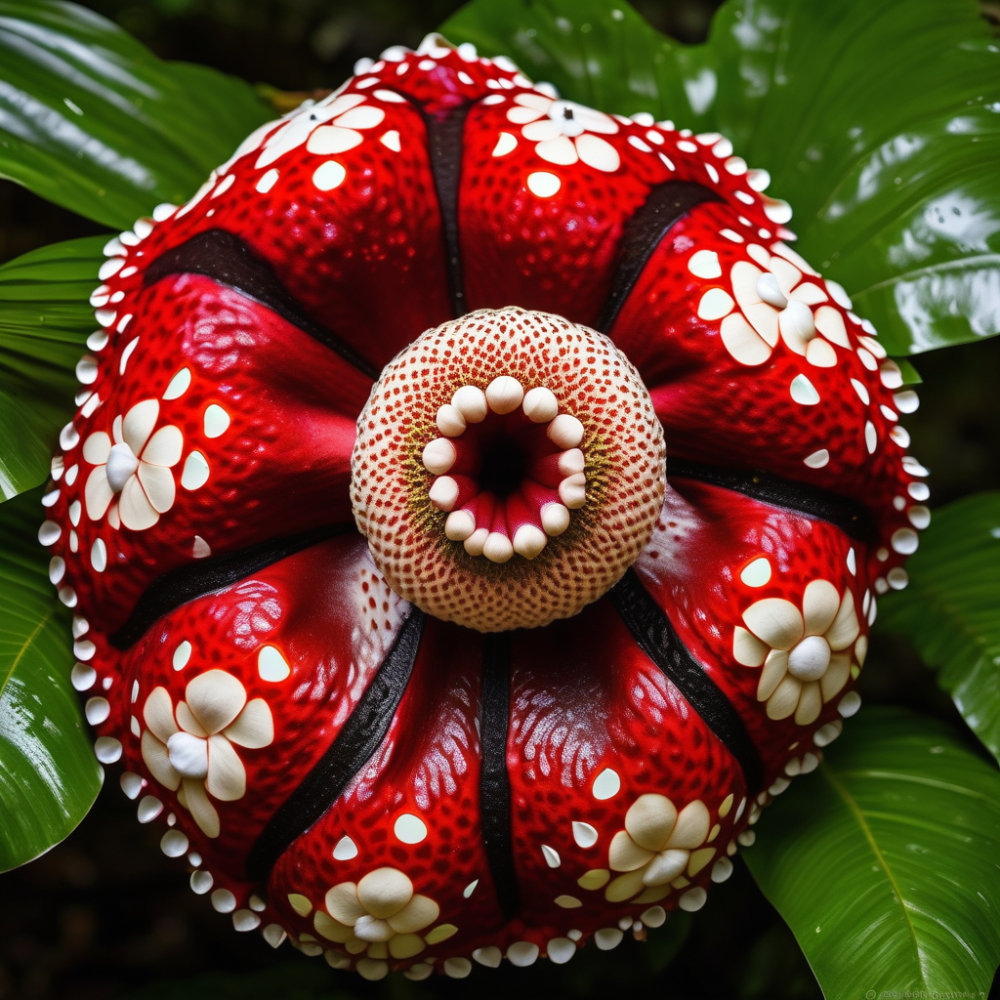

In [25]:
pipe(
    prompt="Rafflesia flower in full bloom surrounded by huge thick, fleshy oval lobes with pointed tips, entire flower is a deep red brown, speckled with white spots, giving it a speckled appearance, set in a lush green rainforest, Vibrant colors, Macro lens, f/4 aperture, ISO 200, natural diffused light",
    negative_prompt="out of frame, low-res, text, error, cropped, worst quality, low quality, jpeg artifacts, duplicate, morbid, mutilated, out of frame, poorly drawn, mutation, deformed, blurry, bad anatomy, bad proportions, missing parts, extra limbs, fused parts, too many spots, long stem, username, watermark, signature",
    num_inference_steps=50,
    guidance_scale=12
).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

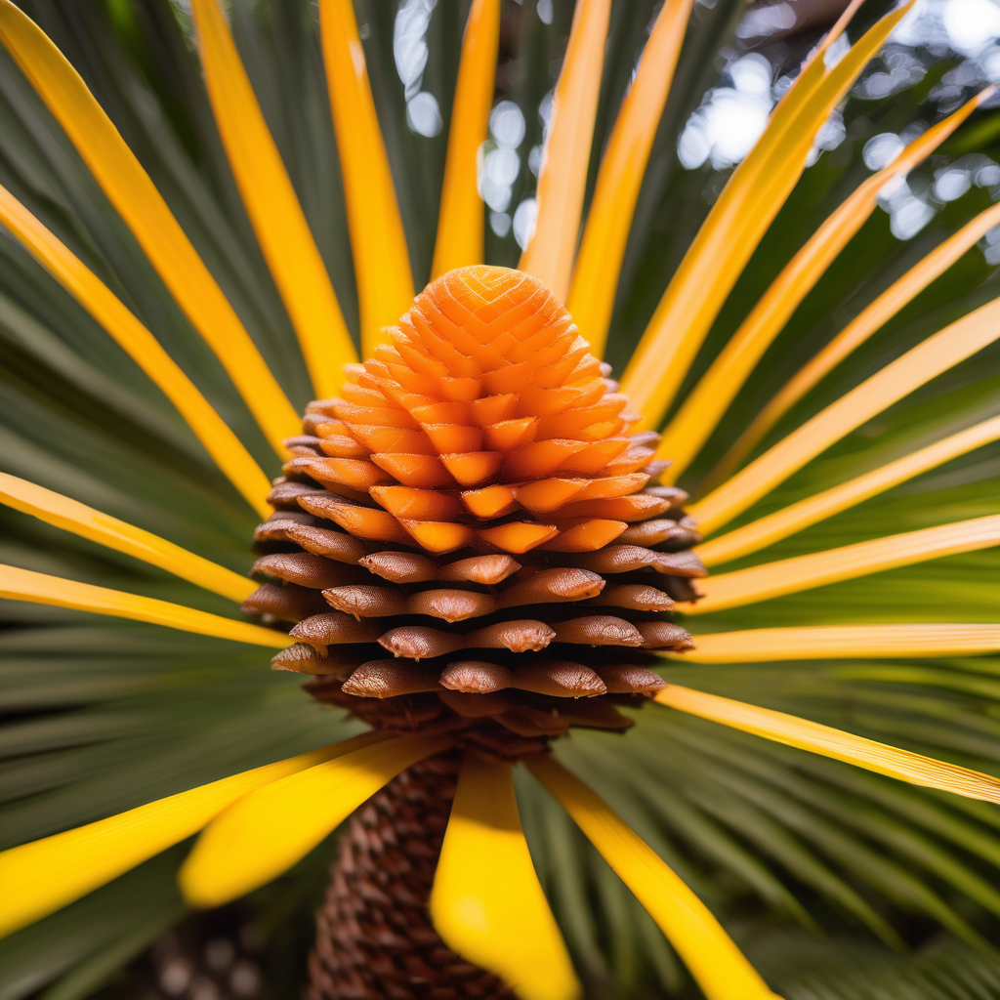

In [27]:
pipe(
    prompt="Encephalartos Woodii flower, a rare cycad species, bright yellow-orange Cone structure with tightly packed scales, lush green and brown surroundings, Macro lens, f/5.6 aperture, ISO 400, natural diffused sunlight filtering through the forest canopy",
    negative_prompt="out of frame, low-res, text, error, cropped, worst quality, low quality, jpeg artifacts, ugly, duplicate, morbid, mutilated, out of frame, poorly drawn, mutation, deformed, blurry, bad anatomy, bad proportions, missing parts, extra limbs, fused parts, too many scales, long stem, username, watermark, signature",
    num_inference_steps=50,
    guidance_scale=12
).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

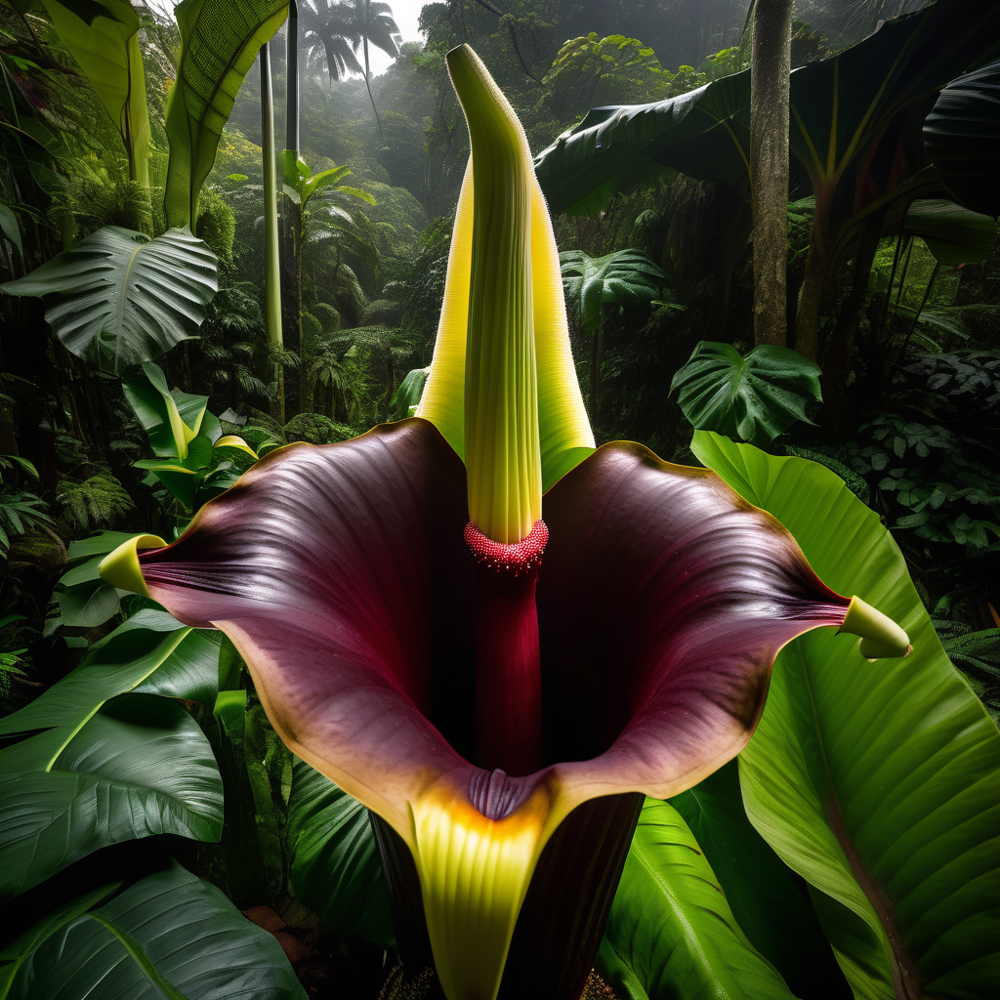

In [33]:
pipe(
    prompt="Top View of Amorphophallus Titanum Corpse Flower, towering inflorescence with a deep burgundy spathe and a tall,  yellow-green phallic spadix, Set against a lush jungle background, Atmospheric mood with a hint of mist, Wide-angle lens, f/11 aperture, ISO 100, soft diffused natural light",
    negative_prompt="out of frame, low-res, text, error, cropped, worst quality, low quality, jpeg artifacts, ugly, duplicate, morbid, mutilated, out of frame, poorly drawn, mutation, deformed, blurry, bad anatomy, bad proportions, missing parts, extra limbs, fused parts, too many scales, long stem, username, watermark, signature",
    num_inference_steps=50,
    guidance_scale=12
).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

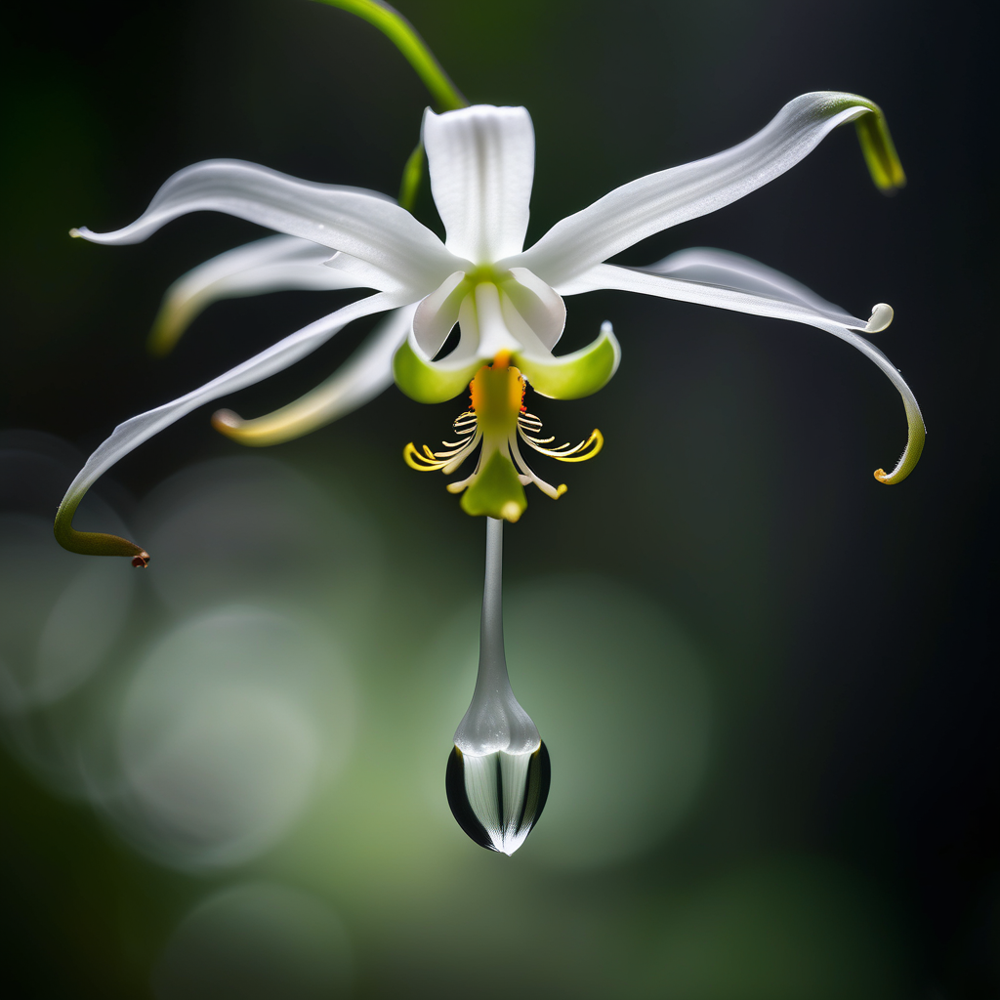

In [35]:
pipe(
    prompt="Ghost Orchid flower, delicate and ethereal, Translucent white petals with a hint of green, Suspended in mid-air against a dark, misty forest background, Mysterious and haunting atmosphere, Macro lens, f/2.8 aperture, ISO 800, soft, diffused lighting",
    negative_prompt="out of frame, low-res, text, error, cropped, worst quality, low quality, jpeg artifacts, ugly, duplicate, morbid, mutilated, out of frame, poorly drawn, mutation, deformed, blurry, bad anatomy, bad proportions, missing parts, extra limbs, fused parts, too many scales, long stem, username, watermark, signature",
    num_inference_steps=50,
    guidance_scale=12
).images[0]

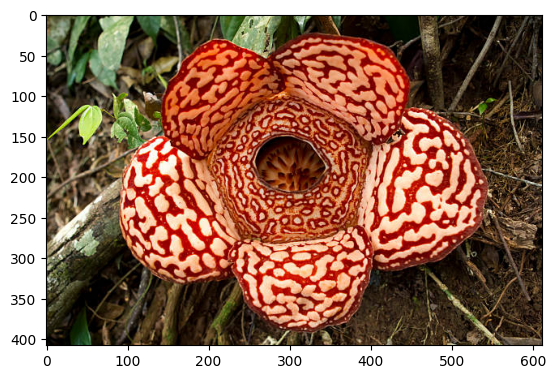

In [18]:
image = read_image('./data/test/Rufflesia-Arnoldii/01.jpeg') / 255.
plt.imshow(image.permute(1, 2, 0))

In [24]:
latent = pipe.vae.encode(image.unsqueeze(0).half().to('cuda'))
sample = latent.latent_dist.sample().detach().half()

In [30]:
latent = torch.randn((1, 4, 128, 128), dtype=torch.float16)

In [3]:
image = pipe(
    prompt="Rafflesia flower in full bloom surrounded by huge thick, fleshy oval lobes with pointed tips, entire flower is a deep red brown, speckled with white spots, giving it a speckled appearance, set in a lush green rainforest, Vibrant colors, Macro lens, f/4 aperture, ISO 200, natural diffused light",
    negative_prompt="out of frame, low-res, text, error, cropped, worst quality, low quality, jpeg artifacts, duplicate, morbid, mutilated, out of frame, poorly drawn, mutation, deformed, blurry, bad anatomy, bad proportions, missing parts, extra limbs, fused parts, too many spots, long stem, username, watermark, signature",
    num_inference_steps=50,
    guidance_scale=12, 
    output_type='latent',
).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

In [4]:
sample = image.cpu().detach() * 0.1 + torch.randn(image.shape, dtype=torch.float16) * 0.9
sample = sample.unsqueeze(0)

In [ ]:
decoded = pipe.vae.decode(image.detach().unsqueeze(0))

  0%|          | 0/50 [00:00<?, ?it/s]

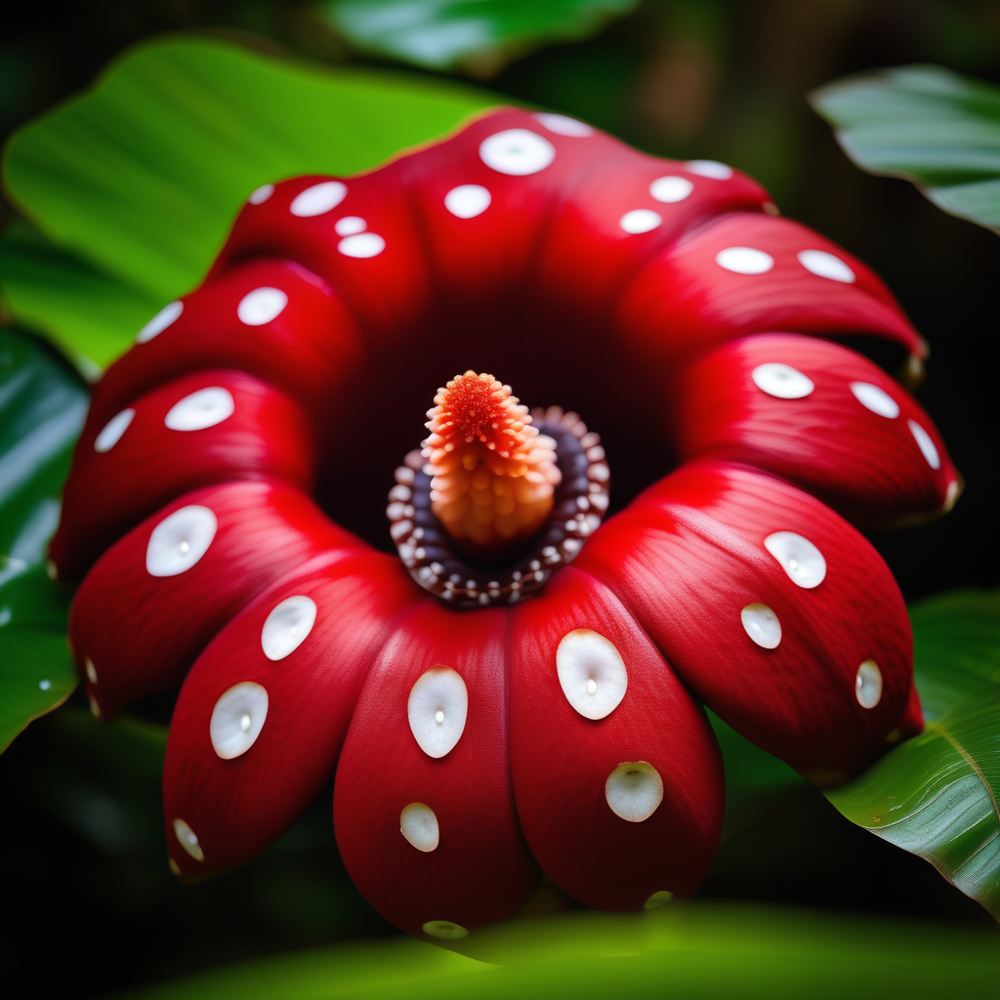

In [49]:
pipe(
    prompt="Rafflesia flower in full bloom surrounded by huge thick, fleshy oval lobes with pointed tips, entire flower is a deep red brown, speckled with white spots, giving it a speckled appearance, set in a lush green rainforest, Vibrant colors, Macro lens, f/4 aperture, ISO 200, natural diffused light",
    negative_prompt="out of frame, low-res, text, error, cropped, worst quality, low quality, jpeg artifacts, duplicate, morbid, mutilated, out of frame, poorly drawn, mutation, deformed, blurry, bad anatomy, bad proportions, missing parts, extra limbs, fused parts, too many spots, long stem, username, watermark, signature",
    num_inference_steps=50,
    guidance_scale=12,
    latents=sample,
).images[0]